---
# Running OBRWR on OS data
---

### Imports

In [1]:
import pickle

import numpy as np
import networkx as nx
import pandas as pd
from obrwr import obrwr_new as ob
#from obrwr import solution_parser as sp


### Building subgraph and retrieving the largest connected component

Here are the different constants related to paths, experiment name etc ...

In [2]:
file_name_PPI = "human.binary.nr0.95.connected.noself.gr"
file_name_signor = "signor_mapped_tyr_nodup.tsv"
back_path = "../"
experiment = 'OS'
sensitive_proteins_file = experiment+"/os_sensitive_OS_withval.tsv"
large_inv_file = "Large/large_invadosome_protein_list.txt"
large_foc_file = "Large/large_focal_protein_list.txt"

Loading the list of sensitive proteins.

In [3]:
df = pd.read_csv(back_path+"05_Output/"+sensitive_proteins_file,sep='\t',index_col=0)
print(df.shape)
df.head()

(45, 4)


,ACC,A5 - A0,A20 - A0,A20 - A5
Entry,,,,
E2RFE1,ITB4_HUMAN,0.0,-0.651147,0.000000
J9P969,NaN,0.0,0.000000,-0.951974
E2QXI3,AIMP1_HUMAN,0.0,1.016291,0.639232
E2QVF9,AIMP2_HUMAN,0.0,0.886867,0.000000
O46674,AT2A2_HUMAN,0.0,-0.839980,0.000000


Loading the PPI as an edge list DataFrame

In [4]:
edge_list = pd.read_csv(back_path+"01_Reference/"+file_name_PPI,sep='\t',header=None)
edge_list.columns = ["source","target"]
edge_list.head()

,source,target
0,A0A024R0L9_HUMAN,RBPMS_HUMAN
1,A0A024R0L9_HUMAN,SHD_HUMAN
2,RBPMS_HUMAN,FBLN4_HUMAN
3,RBPMS_HUMAN,KR122_HUMAN
4,RBPMS_HUMAN,PO6F2_HUMAN


Building NetworkX graphs for both PPI and Signor

In [5]:
complete_G = nx.from_pandas_edgelist(edge_list)
signor = pd.read_csv(back_path+"00_InputData/"+file_name_signor,sep='\t')
signor.columns = ["source","target"]
signor = nx.from_pandas_edgelist(signor,create_using=nx.DiGraph)

Loading datasets of proteins detected in Invadosome + Focal Adhesion (lamellipodia)

In [6]:
dfInv = pd.read_csv(back_path+"00_InputData/"+large_inv_file,sep="\t",header=None)
dfFA = pd.read_csv(back_path+"00_InputData/"+large_foc_file,sep="\t",header=None)

## Building Graph Signor + PPI

PPI subgraph of interest (Proteins in Inva. + Proteins in FA. + sensitive proteins)

In [7]:
list_of_nodes = np.unique(list(dfInv[0])+list(dfFA[0])+list(df['ACC']))
subG = complete_G.subgraph(list_of_nodes)
print("Number of nodes :",len(subG.nodes))
print("Number of connected components :", nx.number_connected_components(subG))
subG = subG.subgraph(max(nx.connected_components(subG), key=len)).copy()
print("Number of nodes :",len(subG.nodes))
print("Number of connected components :", nx.number_connected_components(subG))
nx.set_node_attributes(subG, {node: (node in list(dfInv[0])) for node in subG.nodes}, "Invadosome")
nx.set_node_attributes(subG, {node: (node in list(dfFA[0])) for node in subG.nodes}, "FocalAdhesion")
nx.set_node_attributes(subG, {node: (node in list(df['ACC'])) for node in subG.nodes}, experiment)

Number of nodes : 1505
Number of connected components : 250
Number of nodes : 1251
Number of connected components : 1


Retrieving Signor phosphorylations on same set of protein

In [8]:
signor_large = signor.subgraph(subG.nodes())
signor_large = signor.subgraph(max(nx.connected_components(nx.Graph(signor_large)), key=len))
print(f'Size of signor subgraph : {len(signor_large)}')
print(f"Number of connected components : {nx.number_connected_components(nx.Graph(signor_large))}")

Size of signor subgraph : 142
Number of connected components : 1


Joining the two 

In [9]:
subG = subG.to_directed()
l = []
for n in signor_large.nodes:
    l +=  [n] + [i for i in subG.neighbors(n)]
l = list(np.unique(l+list(df['ACC'])))
subG = subG.subgraph(l)

subG = subG.copy()
subG = nx.compose(signor_large,subG)

In [10]:
len(subG.nodes),len(subG.edges)

(658, 4936)

In [11]:
set(subG.nodes()).difference(nx.descendants(subG,'SRC_HUMAN'))

{'CNOT9_HUMAN', 'SRC_HUMAN'}

# Time 5 - Time 0

In [12]:
time_exp = 'A5 - A0'

In [13]:
myGraph = ob.MyGraph(subG)
myGraph.set_sources(['SRC_HUMAN'],1e4)

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


[463]

In [14]:
d = {}
for i in range(len(df)):
    entr = df['ACC'][i]
    ind = df.index[i]
    val = df[time_exp][ind]
    if val > 0 :
        d[entr] = 1+val
    elif val < 0 :
        d[entr] = 1-val
myGraph.set_targets(d,self_loops=True)

PRAG1_HUMAN 2.194733071839334
CYBP_HUMAN 3.148810426926968
SRRT_HUMAN 2.6884167341000023
SI1L1_HUMAN 2.814129063894132
ASAP2_HUMAN 3.3829801135959023
2AAA_HUMAN 2.9928511348897366
TACC1_HUMAN 3.5523248278057338


In [15]:
beta = 0.7

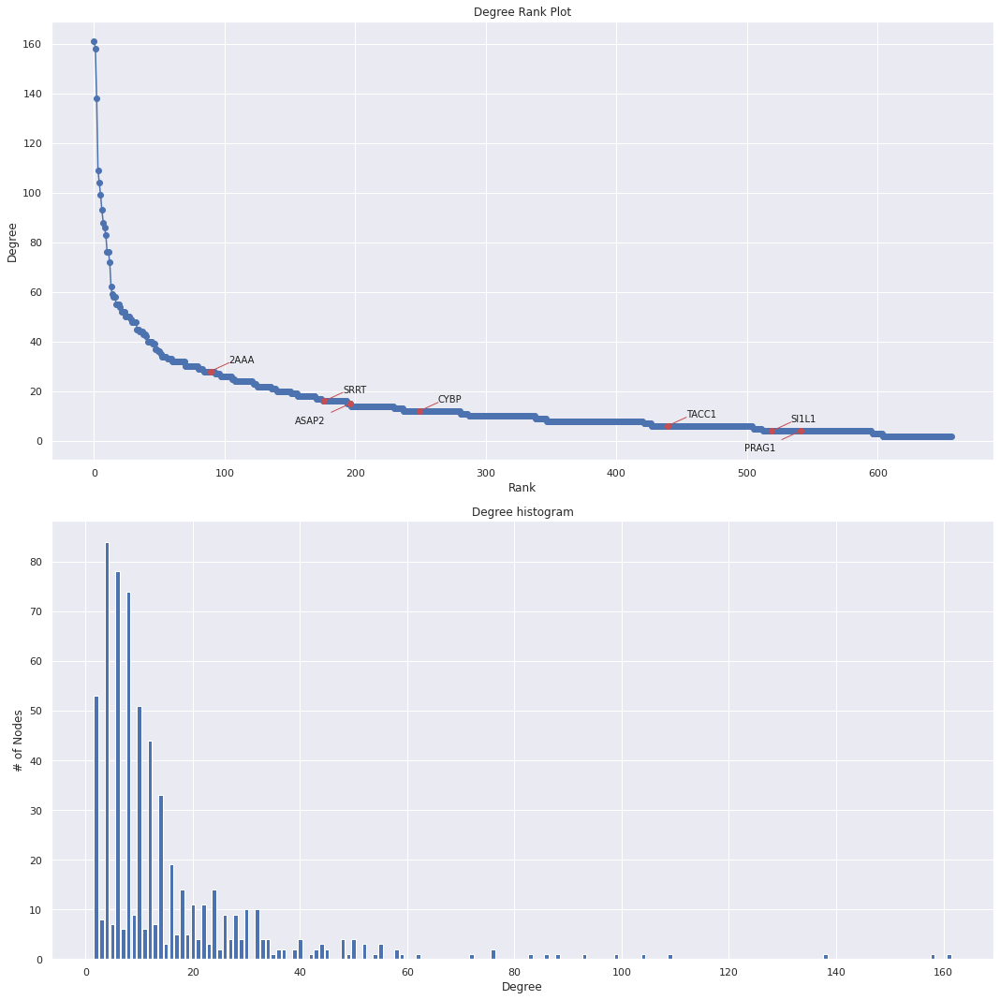

In [16]:
myGraph.plot_degrees("minimal")

In [17]:
targets = nx.get_node_attributes(myGraph.subGdirected_with_annot,'Targets')
degrees = myGraph.subGdirected_with_annot.degree()
degree_sequence_sorted = sorted([d for n, d in degrees])
bins,bin_counts = myGraph.define_bins(degree_sequence_sorted)
bins_nodes = [[] for _ in bins]
target_counts = [0 for _ in bins]
for n,d in degrees:
    for i, (m,M) in enumerate(bins):
        if d <= M:
            bins_nodes[i].append(n)
            if targets[n]:
                target_counts[i] += 1
            break

In [18]:
print(bins)
print(bin_counts)
print(target_counts)

[(0, 2), (3, 4), (5, 6), (7, 8), (9, 10), (11, 13), (14, 16), (17, 24), (25, 34), (34, 161)]
[53, 92, 85, 80, 60, 57, 55, 67, 56, 52]
[0, 2, 1, 0, 0, 1, 2, 0, 1, 0]


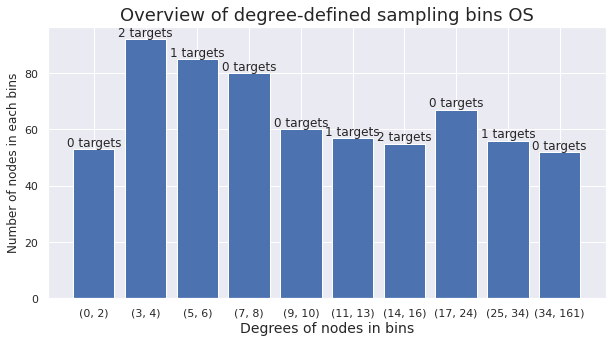

In [19]:
myGraph.plot_sampling_bins(experiment)

In [20]:
import time
t0 = time.time()
myGraph.map_elements_to_int()
print(f'Time to map : {time.time() - t0}')
t0 = time.time()
myGraph.set_stable(["unbiased",beta])
print(f'Time to compute stable : {time.time() - t0}')

Time to map : 3.719329833984375e-05
Time to compute stable : 0.0183870792388916


In [ ]:
folder_exp = back_path+'05_Output/'+experiment+"/"
folder_rd = folder_exp + "random_"+time_exp+'/'
distribution_scores,targets_df,epsilons_df,df_exp = myGraph.get_significative_nodes(beta,1000,experiment,folder_rd)
distribution_scores.to_csv(folder_rd+"/distribution_signor_"+experiment+time_exp+".tsv",sep='\t')
targets_df.to_csv(folder_rd+"/random_targets_signor_"+experiment+time_exp+".tsv",sep='\t',index=False)
epsilons_df.to_csv(folder_rd+"/epsilons_signor_"+experiment+time_exp+".tsv",sep='\t',index=False)
df_exp.to_csv(folder_rd+"/pvals_signor_"+experiment+time_exp+".tsv",sep='\t')

Looking for eps_crit
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5546 cols, 16622 nonzeros
948 rows, 5198 cols, 17176 nonzeros
Presolve : Reductions: rows 948(-381); columns 5198(-409); elements 17176(+371)
Solving the presolved LP
IPX model has 948 rows, 5198 columns and 17176 nonzeros
Input
    Number of variables:                                5198
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17176
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+00]
    Bounds range:                                       [1e+04, 9e+04]
Preprocessing
    Dualized model:                                  

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [3e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17200 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17200(+381)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17200 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17200
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17200 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17200(+381)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17200 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17200
    Matrix range:                                       [4e-05, 6e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
948 rows, 5204 cols, 17198 nonzeros
Presolve : Reductions: rows 948(-381); columns 5204(-409); elements 17198(+381)
Solving the presolved LP
IPX model has 948 rows, 5204 columns and 17198 nonzeros
Input
    Number of variables:                                5204
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17198
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17189(+372)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17189 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 8e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17189(+372)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17189 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5553 cols, 16637 nonzeros
950 rows, 5206 cols, 17187 nonzeros
Presolve : Reductions: rows 950(-379); columns 5206(-407); elements 17187(+370)
Solving the presolved LP
IPX model has 950 rows, 5206 columns and 17187 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17187
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1266 rows, 5551 cols, 16630 nonzeros
947 rows, 5204 cols, 17185 nonzeros
Presolve : Reductions: rows 947(-380); columns 5204(-408); elements 17185(+372)
Solving the presolved LP
IPX model has 947 rows, 5204 columns and 17185 nonzeros
Input
    Number of variables:                                5204
    Number of free variables:                           0
    Number of constraints:                              947
    Number of equality constraints:                     935
    Number of matrix entries:                           17185
    Matrix range:                                       [9e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 16145 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 16145(-674)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 16145 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           16145
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 7e+03]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5553 cols, 16637 nonzeros
950 rows, 5206 cols, 17223 nonzeros
Presolve : Reductions: rows 950(-379); columns 5206(-407); elements 17223(+406)
Solving the presolved LP
IPX model has 950 rows, 5206 columns and 17223 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17223
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17189(+372)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17189 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17189(+372)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17189 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1266 rows, 5551 cols, 16630 nonzeros
947 rows, 5204 cols, 17185 nonzeros
Presolve : Reductions: rows 947(-380); columns 5204(-408); elements 17185(+372)
Solving the presolved LP
IPX model has 947 rows, 5204 columns and 17185 nonzeros
Input
    Number of variables:                                5204
    Number of free variables:                           0
    Number of constraints:                              947
    Number of equality constraints:                     935
    Number of matrix entries:                           17185
    Matrix range:                                       [9e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17228 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17228(+409)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17228 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17228
    Matrix range:                                       [4e-05, 5e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17195 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17195(+376)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17195 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17195
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17189(+370)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17189 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 3e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17193 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17193(+374)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17193 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17193
    Matrix range:                                       [4e-05, 3e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 7e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17225 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17225(+406)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17225 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17225
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5209 cols, 17197 nonzeros
Presolve : Reductions: rows 950(-379); columns 5209(-405); elements 17197(+378)
Solving the presolved LP
IPX model has 950 rows, 5209 columns and 17197 nonzeros
Input
    Number of variables:                                5209
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17197
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 5e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17189(+372)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17189 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17185 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17185(+366)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17185 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17185
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17190 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17190(+371)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17190 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17190
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 8e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17193 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17193(+374)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17193 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17193
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 5e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17190 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17190(+371)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17190 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17190
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [3e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5209 cols, 16150 nonzeros
Presolve : Reductions: rows 950(-379); columns 5209(-405); elements 16150(-669)
Solving the presolved LP
IPX model has 950 rows, 5209 columns and 16150 nonzeros
Input
    Number of variables:                                5209
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           16150
    Matrix range:                                       [4e-05, 4e+00]
    RHS range:                                          [2e+00, 7e+03]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 7e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17235 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17235(+416)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17235 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17235
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17189 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17189(+370)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17189 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 5e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17224 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17224(+407)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17224 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17224
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 4e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17194 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17194(+375)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17194 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17194
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5209 cols, 17197 nonzeros
Presolve : Reductions: rows 950(-379); columns 5209(-405); elements 17197(+378)
Solving the presolved LP
IPX model has 950 rows, 5209 columns and 17197 nonzeros
Input
    Number of variables:                                5209
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17197
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17190 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17190(+371)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17190 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17190
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17225 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17225(+406)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17225 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17225
    Matrix range:                                       [4e-05, 4e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17235 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17235(+416)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17235 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17235
    Matrix range:                                       [4e-05, 3e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17200 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17200(+381)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17200 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17200
    Matrix range:                                       [4e-05, 4e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5209 cols, 17197 nonzeros
Presolve : Reductions: rows 950(-379); columns 5209(-405); elements 17197(+378)
Solving the presolved LP
IPX model has 950 rows, 5209 columns and 17197 nonzeros
Input
    Number of variables:                                5209
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17197
    Matrix range:                                       [4e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 2e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17193 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17193(+376)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17193 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17193
    Matrix range:                                       [3e-05, 6e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17228 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17228(+409)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17228 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17228
    Matrix range:                                       [4e-05, 4e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
949 rows, 5206 cols, 17200 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17200(+381)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17200 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17200
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1266 rows, 5551 cols, 16630 nonzeros
947 rows, 5204 cols, 17185 nonzeros
Presolve : Reductions: rows 947(-380); columns 5204(-408); elements 17185(+372)
Solving the presolved LP
IPX model has 947 rows, 5204 columns and 17185 nonzeros
Input
    Number of variables:                                5204
    Number of free variables:                           0
    Number of constraints:                              947
    Number of equality constraints:                     935
    Number of matrix entries:                           17185
    Matrix range:                                       [9e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 4e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17226 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17226(+407)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17226 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17226
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 4e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1269 rows, 5554 cols, 16639 nonzeros
950 rows, 5207 cols, 17189 nonzeros
Presolve : Reductions: rows 950(-379); columns 5207(-407); elements 17189(+370)
Solving the presolved LP
IPX model has 950 rows, 5207 columns and 17189 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              950
    Number of equality constraints:                     936
    Number of matrix entries:                           17189
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17200 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17200(+381)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17200 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17200
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 1e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
948 rows, 5205 cols, 17202 nonzeros
Presolve : Reductions: rows 948(-381); columns 5205(-409); elements 17202(+383)
Solving the presolved LP
IPX model has 948 rows, 5205 columns and 17202 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     934
    Number of matrix entries:                           17202
    Matrix range:                                       [4e-05, 9e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5553 cols, 16636 nonzeros
949 rows, 5206 cols, 17191 nonzeros
Presolve : Reductions: rows 949(-380); columns 5206(-408); elements 17191(+372)
Solving the presolved LP
IPX model has 949 rows, 5206 columns and 17191 nonzeros
Input
    Number of variables:                                5206
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17191
    Matrix range:                                       [4e-05, 3e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1267 rows, 5552 cols, 16633 nonzeros
948 rows, 5207 cols, 17191 nonzeros
Presolve : Reductions: rows 948(-379); columns 5207(-405); elements 17191(+378)
Solving the presolved LP
IPX model has 948 rows, 5207 columns and 17191 nonzeros
Input
    Number of variables:                                5207
    Number of free variables:                           0
    Number of constraints:                              948
    Number of equality constraints:                     936
    Number of matrix entries:                           17191
    Matrix range:                                       [9e-05, 4e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
1268 rows, 5552 cols, 16634 nonzeros
949 rows, 5205 cols, 17224 nonzeros
Presolve : Reductions: rows 949(-380); columns 5205(-408); elements 17224(+407)
Solving the presolved LP
IPX model has 949 rows, 5205 columns and 17224 nonzeros
Input
    Number of variables:                                5205
    Number of free variables:                           0
    Number of constraints:                              949
    Number of equality constraints:                     935
    Number of matrix entries:                           17224
    Matrix range:                                       [4e-05, 4e+01]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+

In [ ]:
#_ = myGraphCIBN.optimize_biased_walk_normalized(eps_crit,beta)
#myGraphCIBN.add_meta_after_optim(eps_crit,beta,"CIBN")
#myGraphCIBN.map_elements_to_names()
#myGraphCIBN.control_optimization(eps_crit,beta)

In [ ]:
#myGraphCIBN.map_elements_to_int()
#myGraphCIBN.plot_objective_eps(beta)
#myGraphCIBN.map_elements_to_names()

In [ ]:
#eps = eps_crit
#_ = myGraphCIBN.optimize_biased_walk_normalized(eps,beta)
myGraph.map_elements_to_int()
eps_crit,_ = myGraph.find_eps_critic(beta,1e-2)
_ = myGraph.optimize_biased_walk_normalized(eps_crit,beta)

myGraph.add_meta_after_optim(eps_crit,beta,experiment)
myGraph.control_optimization(beta)
myGraph.map_elements_to_names()

In [ ]:
df_exp = pd.read_csv(folder_rd+"/pvals_signor_"+experiment+time_exp+".tsv",sep='\t')
import matplotlib.pyplot as plt
fig = plt.figure("pvalue histogram", figsize = (10,10))
axgrid = fig.add_gridspec(4,2)
ax1  = fig.add_subplot(axgrid[:2,:])
ax1.set_ylabel("counts",fontsize=14)
ax1.plot([0.05,0.05],[0,100],ls="--",c='r')
ax1.hist(df_exp["pvals"],bins=50)
ax1.set_title("Pvalues distributions for "+experiment+time_exp, fontsize=18)

ax2  = fig.add_subplot(axgrid[2:,:])
ax2.hist(df_exp["pvals"],bins=50)
ax2.set_yscale("log")
ax2.plot([0.05,0.05],[0,10],ls="--",c='r')
ax2.set_xlabel("non corrected pvalues",fontsize=14)
ax2.set_ylabel("log scale counts",fontsize=14)
plt.show()

## Looking at epsilons

In [ ]:
epsilons_df = pd.read_csv(folder_rd+"/epsilons_signor_"+experiment+time_exp+".tsv",sep='\t')

In [ ]:
epsilons_df

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.subplots()
ax.hist(epsilons_df)
ax.plot([eps_crit,eps_crit],[0,5],ls = "--", c="r", label = f"eps : {eps_crit}\n pval : {np.sum(epsilons_df['0'] > eps_crit)/100}")
ax.set_ylabel("counts",fontsize=15)
ax.set_xlabel("epsilon value",fontsize=15)
ax.set_title(f"Bias strength (epsilon) distribution\n for {experiment} at {time_exp}  in signor graph\n",fontsize=18)
plt.legend()
plt.show()

## Looking at correlation between RWR (non biased , as distance to Src) and pval

In [ ]:

df_exp = pd.read_csv(folder_rd+"/pvals_signor_"+experiment+time_exp+".tsv",sep='\t')
df_exp.head()

In [ ]:
import time
t0 = time.time()
myGraph.map_elements_to_int()
print(f'Time to map : {time.time() - t0}')
t0 = time.time()
myGraph.set_stable(["unbiased",beta])
print(f'Time to compute stable : {time.time() - t0}')

In [35]:
df_pvals = pd.DataFrame({"pvals":nx.get_node_attributes(myGraph.subGdirected_with_annot,"pvals"+experiment)})
df_correlation = df_pvals.join(pd.DataFrame({"stable":nx.get_node_attributes(myGraph.subGdirected_with_annot,"Stable")}))
df_correlation.head()

,pvals,stable
1433B_HUMAN,0.881119,8.835908
1433E_HUMAN,0.611389,11.988648
1433G_HUMAN,0.208791,7.214810
1433T_HUMAN,0.296703,3.161789
1433Z_HUMAN,0.863137,21.359926


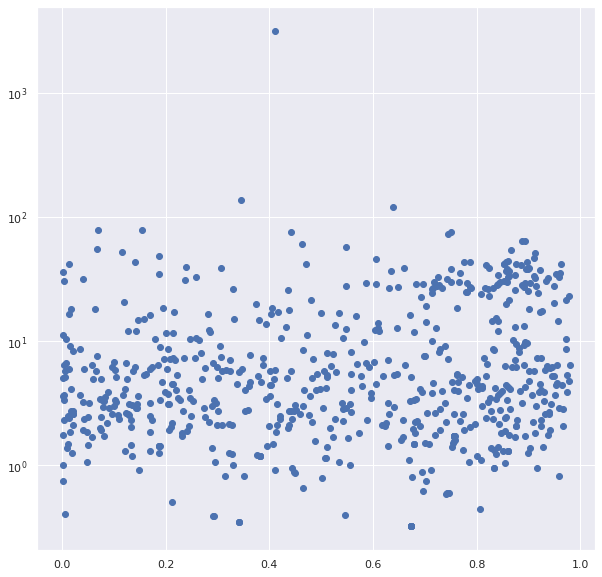

In [36]:
fig = plt.figure(figsize=(10,10))
ax = fig.subplots()
ax.scatter(df_correlation["pvals"],df_correlation["stable"])
ax.set_yscale("log")

## MultiTest correction (Benjamini-Hochberg Correction)

In [37]:
from statsmodels.stats.multitest import fdrcorrection

In [38]:
myGraph.map_elements_to_names()
d = nx.get_node_attributes(myGraph.subGdirected_with_annot,'pvals'+experiment)
nodes = []
pvals = []
for k,v in d.items():
    nodes.append(k)
    pvals.append(v)
mask, corr_pvals = fdrcorrection(pvals,method='i')

(array([71., 60., 55., 47., 55., 46., 55., 79., 99., 90.]),
 array([0.000999  , 0.0989011 , 0.1968032 , 0.29470529, 0.39260739,
        0.49050949, 0.58841159, 0.68631369, 0.78421578, 0.88211788,
        0.98001998]),
 <BarContainer object of 10 artists>)

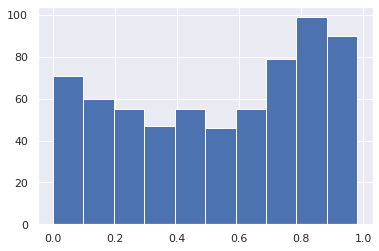

In [39]:
plt.hist(pvals)

(array([  7.,   8.,   3.,  18.,   0.,   2.,  10.,   5.,  16., 588.]),
 array([0.10939061, 0.19645355, 0.28351648, 0.37057942, 0.45764236,
        0.54470529, 0.63176823, 0.71883117, 0.80589411, 0.89295704,
        0.98001998]),
 <BarContainer object of 10 artists>)

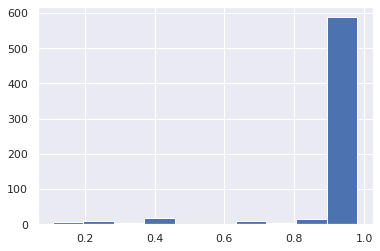

In [40]:
plt.hist(corr_pvals)

In [ ]:
nx.set_node_attributes(myGraph.subGdirected_with_annot,{nodes[i]:corr_pvals[i] for i in range(len(nodes))},"corrected_pvals"+experiment)

## Directed subgraph for sigor OS at T5

In [ ]:
myGraph.map_elements_to_names()
diG = myGraph.get_directed_subgraph()
diG_from_source = myGraph.get_directed_subgraph_from_sources()
diG_edge_proba = myGraph.get_higher_edge_proba_subgraph()

## Saving outputs

In [ ]:
nx.write_gml(diG,back_path+'05_Output/'+experiment+'/signor_dig_'+experiment+time_exp+'.gml')
nx.write_gml(diG_from_source,back_path+'05_Output/'+experiment+'/signor_digfromsrc_'+experiment+time_exp+'.gml')
nx.write_gml(diG_edge_proba,back_path+'05_Output/'+experiment+'/signor_digedge_'+experiment+time_exp+'.gml')

## Saving the global subgraph

In [ ]:
nx.write_gml(myGraph.subGdirected_with_annot,back_path+'05_Output/'+experiment+'/signor_subgraph_'+experiment+time_exp+'.gml')

# Time 20 - Time 0

In [11]:
time_exp = 'A20 - A0'

myGraph = ob.MyGraph(subG)
myGraph.set_sources(['SRC_HUMAN'],1e4)

d = {}
for i in range(len(df)):
    entr = df['ACC'][i]
    ind = df.index[i]
    val = df[time_exp][ind]
    if val > 0 :
        d[entr] = 1+val
    elif val < 0 :
        d[entr] = 1-val
myGraph.set_targets(d,self_loops=True)

beta = 0.7

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


ITB4_HUMAN 1.6511473475148009
AIMP1_HUMAN 2.016290945027336
AIMP2_HUMAN 1.8868665936079658
AT2A2_HUMAN 1.8399804400260997
CTND1_HUMAN 2.0175625156827373
SYEP_HUMAN 1.963095735685961
HNRL2_HUMAN 1.8162997239850291
SYK_HUMAN 2.197303224123864
MET_HUMAN 2.249145780176402
C1TM_HUMAN 2.077424854538368
NOP58_HUMAN 2.2496989486328687
PRC2B_HUMAN 2.211671752771199
SYRC_HUMAN 1.8999447515015007
SHRM2_HUMAN 2.264801023230767
PRAG1_HUMAN 2.144513296167432
EF1A1_HUMAN 2.645291191456966
SF3A1_HUMAN 1.7462725701995048
CYBP_HUMAN 2.5403663132975325
KRI1_HUMAN 2.7224942702052637
HSP72_HUMAN 1.739646506605098
PESC_HUMAN 4.1187892700806685
SI1L1_HUMAN 3.2372250339429343
ASAP2_HUMAN 3.1074497911965366
GOGB1_HUMAN 1.7009400537015331
2AAA_HUMAN 3.073977796684733
E2AK2_HUMAN 2.4257736027947345
RBGP1_HUMAN 2.5921109003498977
RL28_HUMAN 2.127781912114667
TACC1_HUMAN 2.752596032583501


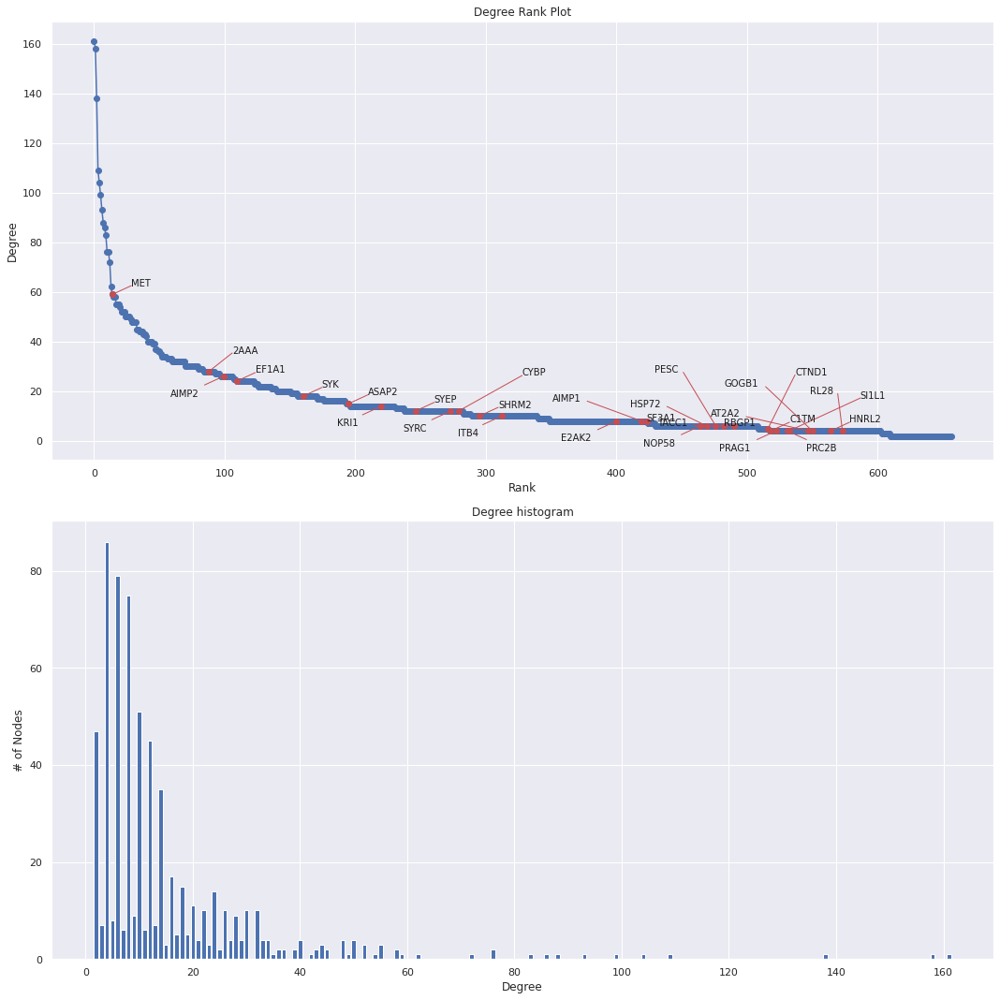

In [12]:
myGraph.plot_degrees("minimal")

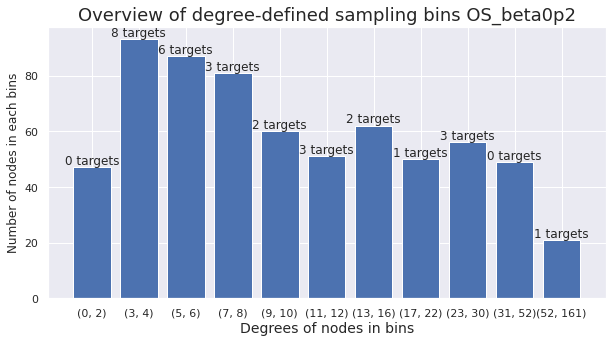

In [13]:
myGraph.plot_sampling_bins(experiment)

Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

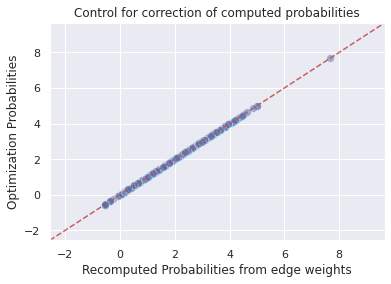

In [14]:
myGraph.map_elements_to_int()
eps_crit,_ = myGraph.find_eps_critic(beta,1e-3)
_ = myGraph.optimize_biased_walk_normalized(eps_crit,beta)

myGraph.add_meta_after_optim(eps_crit,beta,experiment)
myGraph.eps_crit= eps_crit
myGraph.control_optimization(beta)
myGraph.map_elements_to_names()

In [15]:
myGraph.map_elements_to_int()
myGraph.set_stable(["unbiased",beta])

folder_exp = back_path+'05_Output/'+experiment+"/"
folder_rd = folder_exp + "random_"+time_exp+'/'
distribution_scores,targets_df,epsilons_df,df_exp = myGraph.get_significative_nodes(beta,1000,experiment,folder_rd,prec=1e-3)
distribution_scores.to_csv(back_path+'05_Output/'+experiment+"/distribution_signor_"+experiment+time_exp+".tsv",sep='\t')
targets_df.to_csv(back_path+'05_Output/'+experiment+"/random_targets_signor_"+experiment+time_exp+".tsv",sep='\t',index=False)
epsilons_df.to_csv(back_path+'05_Output/'+experiment+"/epsilons_signor_"+experiment+time_exp+".tsv",sep='\t',index=False)
df_exp.to_csv(back_path+'05_Output/'+experiment+"/pvals_signor_"+experiment+time_exp+".tsv",sep='\t')

myGraph.map_elements_to_int()
eps_crit = myGraph.find_eps_critic(beta,1e-3)
_ = myGraph.optimize_biased_walk_normalized(eps_crit,beta)

myGraph.add_meta_after_optim(eps_crit,beta,experiment)
myGraph.control_optimization(eps_crit,beta)
myGraph.map_elements_to_names()

Looking for eps_crit
Input
    Number of variables:                                5257
    Number of free variables:                           0
    Number of constraints:                              1004
    Number of equality constraints:                     946
    Number of matrix entries:                           17405
    Matrix range:                                       [7e-06, 2e+00]
    RHS range:                                          [2e+00, 1e+04]
    Objective range:                                    [1e+00, 1e+00]
    Bounds range:                                       [1e+04, 8e+04]
Preprocessing
    Dualized model:                                     no
    Number of dense columns:                            0
    Range of scaling factors:                           [1.00e+00, 1.00e+00]
IPX version 1.0
Interior Point Solve
 Iter     P.res    D.res            P.obj           D.obj        mu     Time
   0   3.16e+03 1.50e+00   0.00000000e+00 -7.88037119e+07  1.11e+

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


4 / 1000
                     0          1          2          3          4
HNRH1_HUMAN   7.684400   6.417790   5.779305   4.593885   5.000846
EXOC1_HUMAN   5.865396   6.171104   6.154673   8.269496   7.710976
IF4B_HUMAN    1.523939   1.088729   1.258480   1.469338  23.740159
ELP1_HUMAN    3.753576   4.243088   3.930899   9.650603   4.651785
ANXA1_HUMAN  24.499303  32.711812  24.147819  24.417966  56.371366
Time for last 5 runs : 4.448876635233561 min.
Average time per 5 runs : 4.448876635233561 min.


/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
24 / 1000
                    0          1          2          3          4          5   \
HNRH1_HUMAN   7.684400   6.417790   5.779305   4.593885   5.000846   6.170395   
EXOC1_HUMAN   5.865396   6.171104   6.154673   8.269496   7.710976   6.239486   
IF4B_HUMAN    1.523939   1.088729   1.258480   1.469338  23.740159   1.384386   
ELP1_HUMAN    3.753576   4.243088   3.930899   9.650603   4.651785   4.189141   
ANXA1_HUMAN  24.499303  32.711812  24.147819  24.417966  56.371366  24.791757   

              

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
329 / 1000
                   0          1          2          3          4          5    \
HNRH1_HUMAN   7.684400   6.417790   5.779305   4.593885   5.000846   6.170395   
EXOC1_HUMAN   5.865396   6.171104   6.154673   8.269496   7.710976   6.239486   
IF4B_HUMAN    1.523939   1.088729   1.258480   1.469338  23.740159   1.384386   
ELP1_HUMAN    3.753576   4.243088   3.930899   9.650603   4.651785   4.189141   
ANXA1_HUMAN  24.499303  32.711812  24.147819  24.417966  56.371366  24.791757   

             

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
759 / 1000
                   0          1          2          3          4          5    \
HNRH1_HUMAN   7.684400   6.417790   5.779305   4.593885   5.000846   6.170395   
EXOC1_HUMAN   5.865396   6.171104   6.154673   8.269496   7.710976   6.239486   
IF4B_HUMAN    1.523939   1.088729   1.258480   1.469338  23.740159   1.384386   
ELP1_HUMAN    3.753576   4.243088   3.930899   9.650603   4.651785   4.189141   
ANXA1_HUMAN  24.499303  32.711812  24.147819  24.417966  56.371366  24.791757   

                   6          7          8          9    ...        750  \
HNRH1_HUMAN   5.549475   6.081498   4.862325   5.419511  ...   0.761988   
EXOC1_HUMAN   7.329250  10

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: invalid value encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:376: RuntimeWarning: divide by zero encountered in true_divide
  self.b = EX/np.array([piX[i[0]] for i in self.e_l])
/opt/conda/lib/python3.10/site-packages/obrwr/obrwr_new.py:380: RuntimeWarning: invalid value encountered in double_scalars
  self.b = [(self.b[i]/count[el[0]] if self.b[i] else 0) for i,el in enumerate(self.e_l)]


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:215: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  warn('spsolve is more efficient when sparse b '


Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Variable definition
Objective definition
Constr4 definition
sets defined
Constr5 definition
sets defined
Constr piisdist definition
Writing Model
Model definition
Varia

TypeError: unsupported operand type(s) for -: 'int' and 'tuple'

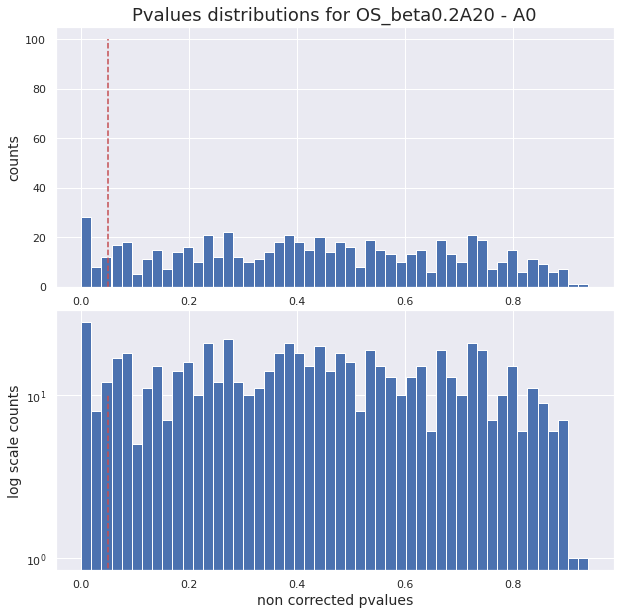

In [16]:
import matplotlib.pyplot as plt
fig = plt.figure("pvalue histogram", figsize = (10,10))
axgrid = fig.add_gridspec(4,2)
ax1  = fig.add_subplot(axgrid[:2,:])
ax1.set_ylabel("counts",fontsize=14)
ax1.plot([0.05,0.05],[0,100],ls="--",c='r')
ax1.hist(df_exp["pvals"],bins=50)
ax1.set_title("Pvalues distributions for "+experiment+time_exp, fontsize=18)

ax2  = fig.add_subplot(axgrid[2:,:])
ax2.hist(df_exp["pvals"],bins=50)
ax2.set_yscale("log")
ax2.plot([0.05,0.05],[0,10],ls="--",c='r')
ax2.set_xlabel("non corrected pvalues",fontsize=14)
ax2.set_ylabel("log scale counts",fontsize=14)
plt.show()

## Looking at epsilons

In [19]:
epsilons_df = pd.read_csv(back_path+'05_Output/'+experiment+"/epsilons_signor_"+experiment+time_exp+".tsv",sep='\t')

ValueError: operands could not be broadcast together with shapes (1000,) (2,) 

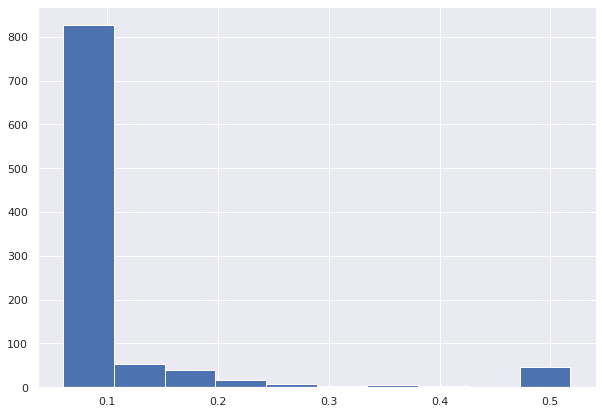

In [20]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,7))
ax = fig.subplots()
ax.hist(epsilons_df)
ax.plot([eps_crit,eps_crit],[0,5],ls = "--", c="r", label = f"eps : {eps_crit}\n pval : {np.sum(epsilons_df['0'] > eps_crit)/100}")
ax.set_ylabel("counts",fontsize=15)
ax.set_xlabel("epsilon value",fontsize=15)
ax.set_title(f"Bias strength (epsilon) distribution\n for {experiment} at {time_exp}  in signor graph\n",fontsize=18)
plt.legend()
plt.show()

## MultiTest correction (Benjamini-Hochberg Correction)

In [19]:
from statsmodels.stats.multitest import fdrcorrection

In [20]:
myGraph.map_elements_to_names()
d = nx.get_node_attributes(myGraph.subGdirected_with_annot,'pvals'+experiment)
nodes = []
pvals = []
for k,v in d.items():
    nodes.append(k)
    pvals.append(v)
mask, corr_pvals = fdrcorrection(pvals,method='i')

(array([83., 52., 81., 65., 88., 76., 57., 82., 49., 24.]),
 array([0.000999  , 0.09480519, 0.18861139, 0.28241758, 0.37622378,
        0.47002997, 0.56383616, 0.65764236, 0.75144855, 0.84525475,
        0.93906094]),
 <BarContainer object of 10 artists>)

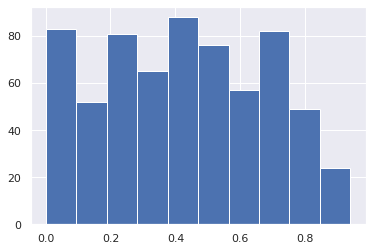

In [21]:
plt.hist(pvals)

(array([ 16.,   4.,   8.,   3.,   2.,   0.,   4.,  48., 536.,  36.]),
 array([0.21878122, 0.29080919, 0.36283716, 0.43486513, 0.50689311,
        0.57892108, 0.65094905, 0.72297702, 0.795005  , 0.86703297,
        0.93906094]),
 <BarContainer object of 10 artists>)

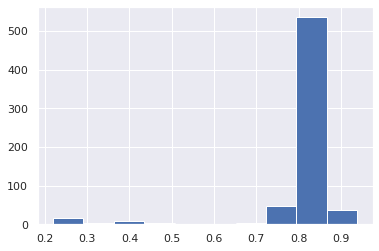

In [22]:
plt.hist(corr_pvals)

In [ ]:
nx.set_node_attributes(myGraph.subGdirected_with_annot,{nodes[i]:corr_pvals[i] for i in range(len(nodes))},"corrected_pvals"+experiment)

## Directed subgraph for sigor OS at T20

In [21]:
myGraph.map_elements_to_names()
diG = myGraph.get_directed_subgraph()
diG_from_source = myGraph.get_directed_subgraph_from_sources()
diG_edge_proba = myGraph.get_higher_edge_proba_subgraph()

{'ASAP2_HUMAN', 'MET_HUMAN', 'PP2AA_HUMAN', 'CTND1_HUMAN', '2AAA_HUMAN', 'SHRM2_HUMAN'}


## Saving outputs

In [22]:
nx.write_gml(diG,back_path+'05_Output/'+experiment+'/signor_dig_'+experiment+time_exp+'.gml')
nx.write_gml(diG_from_source,back_path+'05_Output/'+experiment+'/signor_digfromsrc_'+experiment+time_exp+'.gml')
nx.write_gml(diG_edge_proba,back_path+'05_Output/'+experiment+'/signor_digedge_'+experiment+time_exp+'.gml')

## Saving the global subgraph

In [23]:
nx.write_gml(myGraph.subGdirected_with_annot,back_path+'05_Output/'+experiment+'/signor_subgraph_'+experiment+time_exp+'.gml')